# Bayesian Regression Models Exploration

<br>
Qianyu(Esther) Xu

2023-11-15

** This project helps in understanding Bayesian multiple Gaussian and robust regression models. This is a project focused on the application and analysis of these advanced statistical methods.**

## 1. Data

Consider data `state.x77` from R datasets. 

In [43]:
#!pip install pymc
#!pip install graphviz

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import pymc as pm
import arviz as az
import statsmodels.api as sm

az.style.use('arviz-darkgrid')

In [44]:
df = pd.read_csv('state_x77.csv')
df.head()

,Population,Income,Illiteracy,Life Exp,Murder,HS Grad,Frost,Area
0,3615,3624,2.1,69.05,15.1,41.3,20,50708
1,365,6315,1.5,69.31,11.3,66.7,152,566432
2,2212,4530,1.8,70.55,7.8,58.1,15,113417
3,2110,3378,1.9,70.66,10.1,39.9,65,51945
4,21198,5114,1.1,71.71,10.3,62.6,20,156361


In [45]:
df.describe()

,Population,Income,Illiteracy,Life Exp,Murder,HS Grad,Frost,Area
count,50.000000,50.000000,50.000000,50.000000,50.00000,50.000000,50.000000,50.000000
mean,4246.420000,4435.800000,1.170000,70.878600,7.37800,53.108000,104.460000,70735.880000
std,4464.491433,614.469939,0.609533,1.342394,3.69154,8.076998,51.980848,85327.299622
min,365.000000,3098.000000,0.500000,67.960000,1.40000,37.800000,0.000000,1049.000000
25%,1079.500000,3992.750000,0.625000,70.117500,4.35000,48.050000,66.250000,36985.250000
50%,2838.500000,4519.000000,0.950000,70.675000,6.85000,53.250000,114.500000,54277.000000
75%,4968.500000,4813.500000,1.575000,71.892500,10.67500,59.150000,139.750000,81162.500000
max,21198.000000,6315.000000,2.800000,73.600000,15.10000,67.300000,188.000000,566432.000000


## 2. Using LifeExp as response, fit Gaussian and robust non-hierarchical regression Bayesian models using PYMC.

In [46]:
# Using 'Life Exp' as resphone
X = df.drop(columns = ['Life Exp'])
y = df['Life Exp']

# Standarizing the predictors
X_standardized = (X - X.mean()) / X.std()



In [47]:
num_predictors = X_standardized.shape[1]

names_predictors = X_standardized.columns

### 2.1 Gaussian Model

The Gaussian model, also known as the Normal Linear Regression Model, is mathematically represented as follows:

$$Y_i = \beta_0 + \beta_1X_{i1} + \beta_2X_{i2} + ... + \beta_pX_{ip} + ϵ_i$$

**Where:**

- $Y_i$ is the response variable (in our case, this is `Life Exp`)
- $X_{i1},X_{i2},...X_{ip}$ are the predictor variables.
- $\beta_0,\beta_1,...,\beta_p$ are the regression coefficients. $\beta_0$ is intercept and $\beta_1$ to $\beta_p$ are the slopes associated with each predictor.
- $\epsilon_i$ denotes the error terms for each observation. These are assumed to be normally distributed with mean $0$ and standard deviation of $\sigma$ (i.e., $\epsilon_i \sim \mathcal{N}(0, \sigma^2)$)

In our model, the goal is often to estimate the values of the regression coefficients ($\beta_0, \beta_1, ..., \beta_p$) that best explain the relationship between the predictors and the response variable, under the assumption that the residuals (errors) are typically distributed.

In [48]:
with pm.Model() as gaussian_model:
    
    # Priors
    # Include data that is constant and won't be changed during the sampling process
    X_data = pm.ConstantData("X_data", X_standardized) 
    b_0 = pm.Normal('b_0', mu = 0, sigma = 10)
    b_p = pm.Normal('b_p', mu = 0, sigma = 2, shape = num_predictors)
    sigma = pm.HalfFlat('sigma')
    
    # Excepted outcome
    mu = b_0 + pm.math.dot(b_p, X_data.T)
    
    # Likelihood
    Y_i = pm.Normal('Y_i', mu = mu, sigma = sigma, observed = y)

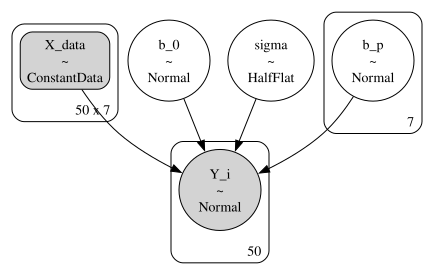

In [49]:
pm.model_to_graphviz(gaussian_model)

#### 2.1.2 Sampling from the Gaussian Model

In [64]:
with gaussian_model:
    inf_gaussian = pm.sample(draws = 2000, 
                             tune = 2000, 
                             chains = 4, 
                             cores = 2, 
                             return_inferencedata = True,
                             random_seed = 42)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 2 jobs)
NUTS: [b_0, b_p, sigma]


Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 4 seconds.


In [65]:
az.summary(inf_gaussian, round_to = 2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
b_0,70.87,0.11,70.67,71.09,0.0,0.0,8998.23,5851.11,1.0
b_p[0],0.23,0.13,-0.02,0.48,0.0,0.0,6723.24,6254.71,1.0
b_p[1],-0.01,0.16,-0.30,0.28,0.0,0.0,7315.40,5938.43,1.0
b_p[2],0.02,0.23,-0.42,0.45,0.0,0.0,4809.02,5114.30,1.0
b_p[3],-1.10,0.18,-1.44,-0.77,0.0,0.0,6505.23,5938.26,1.0
b_p[4],0.39,0.20,0.02,0.75,0.0,0.0,5471.55,5570.88,1.0
b_p[5],-0.30,0.17,-0.61,0.01,0.0,0.0,5704.87,5919.89,1.0
b_p[6],-0.01,0.15,-0.28,0.26,0.0,0.0,5491.72,6273.28,1.0
sigma,0.77,0.09,0.61,0.94,0.0,0.0,5904.09,5324.39,1.0


**Summary Statistics for `Gaussian Model`**

- **Intercept (b_0):** The mean of the intercept is approximately 70.87 with a negligible standard deviation, indicating a solid certainty in this estimate. The high adequate sample size (ESS) and an R-hat value of 1.0 suggest that the sampling for the intercept is reliable and has converged well.

- **Slope Coefficients(b_p\[i\]):** The slopes from b_p\[0\] to \[6\] exhibit R-hat values of 1.0, a sign of convergence across multiple chains. The mean values of the slopes indicate the magnitude and direction of the relationship between each predictor and the response variable. The relatively low standard deviations imply that the estimates are precise.

- **Standard Deviation of Residuals(sigma):** The standard deviation of the residuals has a mean value 0.77. The moderate standard deviation of this estimate and an R-hat of 1.0 suggest a reasonable level of uncertainty in the residual variation, but the chains have converged well.

array([[<Axes: title={'center': 'b_0'}>, <Axes: title={'center': 'b_0'}>],
       [<Axes: title={'center': 'b_p\n0'}>,
        <Axes: title={'center': 'b_p\n0'}>],
       [<Axes: title={'center': 'b_p\n1'}>,
        <Axes: title={'center': 'b_p\n1'}>],
       [<Axes: title={'center': 'b_p\n2'}>,
        <Axes: title={'center': 'b_p\n2'}>],
       [<Axes: title={'center': 'b_p\n3'}>,
        <Axes: title={'center': 'b_p\n3'}>],
       [<Axes: title={'center': 'b_p\n4'}>,
        <Axes: title={'center': 'b_p\n4'}>],
       [<Axes: title={'center': 'b_p\n5'}>,
        <Axes: title={'center': 'b_p\n5'}>],
       [<Axes: title={'center': 'b_p\n6'}>,
        <Axes: title={'center': 'b_p\n6'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>]], dtype=object)

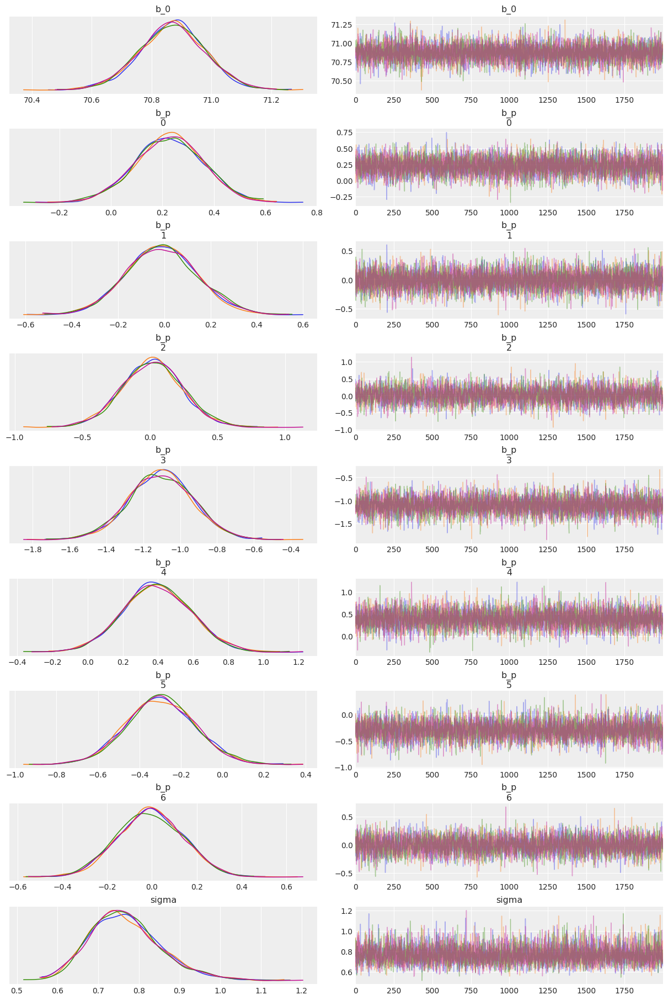

In [66]:
az.plot_trace(inf_gaussian, compact = False)

**Summary Trace Plots for `Gaussian Model`**

- **Intercept (b_0)**: The trace for the intercept indicates that the chains are well-mixed and stationary, implying that the sampling method effectively explores the posterior distribution.
  
- **Slope Coefficients (b_p[i])**: The trace plots for the slope coefficients show no apparent trends or periodicities, suggesting that the MCMC algorithm has converged and that the samples are representative of the posterior distribution.
  
- **Standard Deviation of Residuals (sigma)**: The sigma trace plot also demonstrates good mixing and lack of systematic trends, indicating effective exploration of the posterior distribution for the residual variance.

**Kernel Density Estimation (KDE) Plots for `Gaussian Model`**

- **Intercept (b_0)**: The KDE is sharp and centered, reflecting high confidence in the intercept estimate.
  
- **Slope Coefficients (b_p[i])**: The KDEs for the slope coefficients are primarily symmetrical and peaky, denoting precise point estimates. Some KDEs are broader, like b_p[2], indicating more uncertainty in those particular slope estimates.
  
- **Standard Deviation of Residuals (sigma)**: The KDE for sigma is somewhat asymmetrical with a rightward skew, suggesting a distribution that leans towards higher values.

**Overall Analysis for `Gaussian Model`**

- The MCMC sampling process performs well, with no significant convergence issues detected in the parameters' sampling.

- The posterior distributions for the parameters are accurately determined, with the intercept showing an exact estimate.

- The effective sample sizes are sufficiently large, enhancing the reliability of these estimates.

- Consistent R-hat values at the optimal level of 1.0 across all parameters solidify the evidence for good convergence.

### 2.2 Robust Model

The Robust Model is designed to be more resilient to data outliers than the standard Gaussian model. It achieves this by using a Student's T-distribution for the likelihood, which has heavier tails than a normal distribution. The mathematical representation of the model is similar to the Gaussian model, with a critical difference in the distribution of the error terms:

$$Y_i = \beta_0 + \beta_1X_{i1} + \beta_2X_{i2} + ... + \beta_pX_{ip} + ϵ_i$$

**Where:**
- $\epsilon_i$ represents the error terms for each observation. In contrast to the Gaussian model, these error terms are assumed to follow a Student's T-distribution with degrees of freedom $\nu$, mean $0$, and scale $\sigma$. This is denoted as $\epsilon_i \sim T_\nu(0, \sigma^2)$.

Using the Student's T-distribution for the error terms makes the Robust Model particularly useful when the data contains outliers, as the heavier tails of the T-distribution can better accommodate these extreme values without unduly influencing the entire model.

In [67]:
with pm.Model() as robust_model:
    
    # Priors
    # Include data that is constant and won't be changed during the sampling process
    X_data = pm.ConstantData("X_data", X_standardized) 
    b_0 = pm.Normal('b_0', mu = 0, sigma = 10)
    b_p = pm.Normal('b_p', mu = 0, sigma = 2, shape = num_predictors)
    sigma = pm.HalfFlat('sigma')
    nu = pm.Exponential('nu', 1/30)
    
    # Excepted outcome
    mu = b_0 + pm.math.dot(b_p, X_data.T)
    
    # Likelihood
    Y_i = pm.StudentT('Y_i', mu = mu, sigma = sigma, nu = nu, observed = y)
    
    

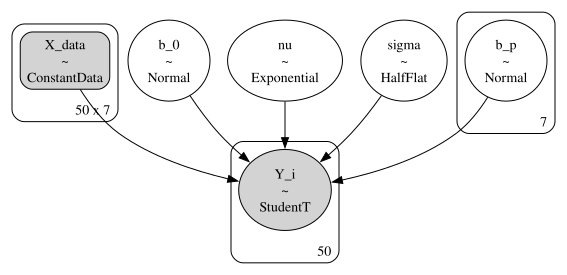

In [68]:
pm.model_to_graphviz(robust_model)

#### 2.2.2 Sampling from the Robust Model

In [69]:
with robust_model:
    inf_robust = pm.sample(draws = 2000, 
                           tune = 2000, 
                           chains = 4, 
                           cores = 2, 
                           return_inferencedata = True,
                           random_seed = 42)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 2 jobs)
NUTS: [b_0, b_p, sigma, nu]


Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 5 seconds.


In [70]:
az.summary(inf_robust, round_to=2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
b_0,70.87,0.11,70.65,71.07,0.00,0.00,9656.83,5837.92,1.0
b_p[0],0.24,0.14,-0.02,0.49,0.00,0.00,6401.99,5600.25,1.0
b_p[1],-0.03,0.16,-0.34,0.27,0.00,0.00,6925.83,5683.57,1.0
b_p[2],-0.01,0.23,-0.44,0.42,0.00,0.00,4580.31,5356.43,1.0
b_p[3],-1.11,0.18,-1.44,-0.77,0.00,0.00,6579.51,5878.34,1.0
b_p[4],0.37,0.20,-0.01,0.74,0.00,0.00,5309.74,5653.48,1.0
b_p[5],-0.29,0.17,-0.60,0.04,0.00,0.00,6366.20,6142.45,1.0
b_p[6],0.01,0.15,-0.27,0.30,0.00,0.00,6003.68,5867.04,1.0
sigma,0.74,0.09,0.58,0.92,0.00,0.00,6930.19,5588.36,1.0
nu,39.55,31.39,2.52,96.02,0.36,0.27,7153.82,6047.92,1.0


**Summary Statistics for `Robust Model`**

- **Intercept (b_0):** The intercept has a mean of approximately 70.87, and the narrow standard deviation suggests that the estimate is precise. The R-hat value is 1.0, indicating good convergence.

- **Slope Coefficients(b_p\[i\]):** The slopes have mean values ranging from -1.11 to 0.37, indicating various strengths and directions of relationships with the response variable. All R-hat values are at 1.0, which is optimal and suggests that each slope coefficient's chains have converged.

- **Standard Deviation of Residuals(sigma):** Sigma has a mean of 0.74, representing the average variability of the residuals around the fitted values. The R-hat value is 1.0, suggesting that the estimate for sigma is stable across the chains.

- **Nu (Degrees of Freedom for the T-distribution)**: The `nu` parameter, which controls the heaviness of the tails in the T-distribution (used for modeling the residuals), has a high mean value (around 39.55), indicating that the model is close to a normal distribution in terms of the distribution of residuals. The R-hat value of 1.0 indicates that the sampling of `nu` has converged well.

array([[<Axes: title={'center': 'b_0'}>, <Axes: title={'center': 'b_0'}>],
       [<Axes: title={'center': 'b_p\n0'}>,
        <Axes: title={'center': 'b_p\n0'}>],
       [<Axes: title={'center': 'b_p\n1'}>,
        <Axes: title={'center': 'b_p\n1'}>],
       [<Axes: title={'center': 'b_p\n2'}>,
        <Axes: title={'center': 'b_p\n2'}>],
       [<Axes: title={'center': 'b_p\n3'}>,
        <Axes: title={'center': 'b_p\n3'}>],
       [<Axes: title={'center': 'b_p\n4'}>,
        <Axes: title={'center': 'b_p\n4'}>],
       [<Axes: title={'center': 'b_p\n5'}>,
        <Axes: title={'center': 'b_p\n5'}>],
       [<Axes: title={'center': 'b_p\n6'}>,
        <Axes: title={'center': 'b_p\n6'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'nu'}>, <Axes: title={'center': 'nu'}>]],
      dtype=object)

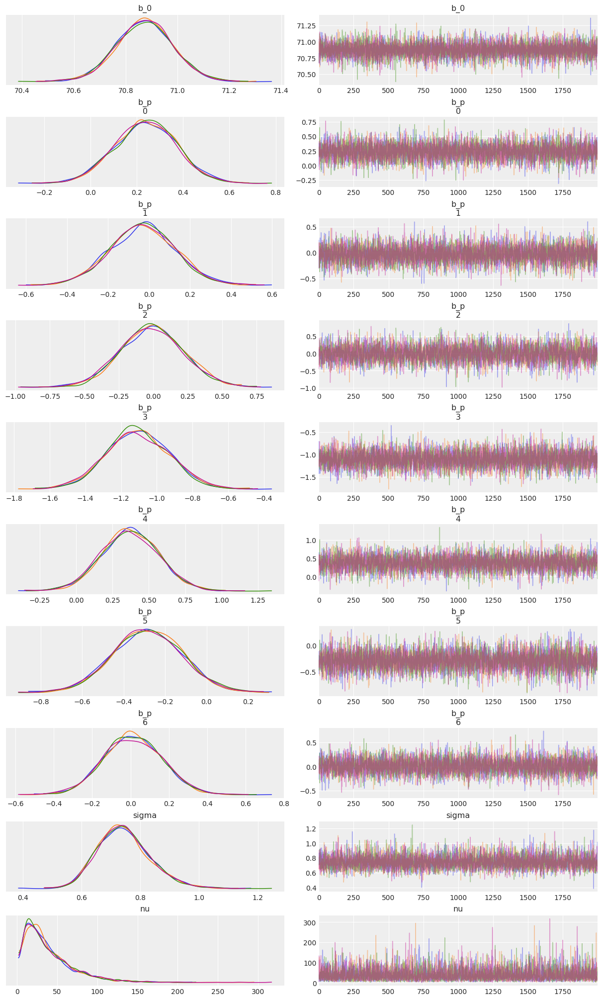

In [71]:
az.plot_trace(inf_robust, compact = False)

**Summary Trace Plots for `Robust Model`**

- **Intercept (b_0)**: The trace plot for the intercept shows the chains mixing well, with no visible trends, which suggests a stable sampling process.

- **Slope Coefficients (b_p\[i\])**: The slope trace plots indicate that the chains overlap and show no systematic trends or cycles, which is a sign of good mixing and convergence.

- **Sigma**: The trace plot for Sigma shows good mixing, and the chains appear stable and convergent.

- **Nu**: The trace plot for `nu` also indicates that the chains have mixed well. However, the scale of the y-axis is quite large, suggesting a wide range of explored values, which could imply that the model needs to be more specific about this parameter.

**Kernel Density Estimation (KDE) Plots for `Robust Model`**

- **Intercept (b_0)**: The KDE is narrow, indicating that the posterior distribution of the intercept is concentrated around the mean.

- **Slope Coefficients (b_p\[i\])**: The KDEs for the slopes are relatively narrow, suggesting that the posterior estimates are precise. However, some slopes (like b_p\[2\] and b_p\[3\]) have broader distributions, indicating more uncertainty in those estimates.

- **Sigma**: The KDE for sigma is unimodal and slightly skewed to the right, indicating that the model has sampled more from the higher end of the possible values for sigma.

- **Nu**: The KDE for `nu` is skewed to the right, and the distribution of sampled values is spread out, suggesting some uncertainty about this parameter. The extended right tail indicates that the model explores a wide range of values, which reflects the robust nature of the model to outliers.

**Overall Analysis for `Robust Model`**

- The robust model's parameters are well sampled, with the summary statistics showing good convergence indicated by the R-hat values.

- The intercept and slope coefficients are precisely estimated, as reflected by their narrow KDEs.

- The standard deviation of residuals (sigma) is also well estimated, with a slight preference for higher values.

- The degrees of freedom (`nu`) shows a right skew in its KDE plot, which is typical for robust models where the exact value of `nu` can be less specific.

- The trace plots do not exhibit problematic patterns, suggesting that the sampling process appropriately explores the parameter space.

## 3. Include in the report:

### 3.1 ACF functions of the intercept, all slopes and standard deviations of both models, shape parameter for the robust model

- **Autocorrelation Function(ACF) for the Gaussian Model**

(-0.2, 1.2)

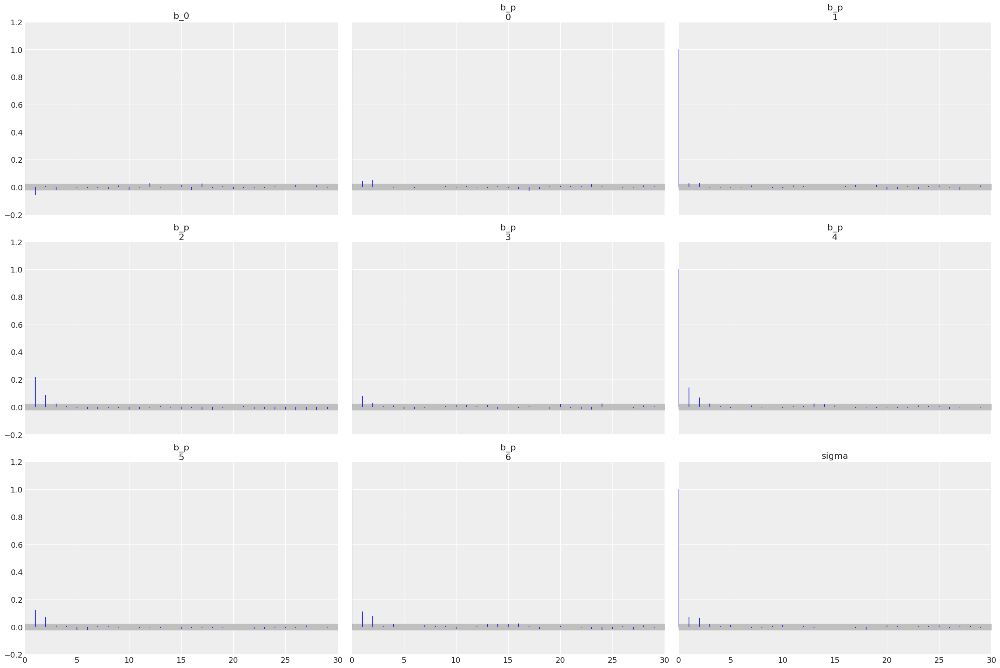

In [72]:
az.plot_autocorr(inf_gaussian, max_lag = 30, combined = True)
plt.ylim([-0.2, 1.2])

**Summary ACF for `Gaussian Model`**

- **b_0(Intercept):** The ACF for the intercept shows only the expected inital spike at lag 0, suggesting no autocorrelation issues with the intercept's Markov Chain Monte Carlo(MCMC) samples.

- **b_p\[i\](Slopes):** The slopes display similar behavior with spikes at lag 0 and negligible autocorrection at higher lags, indicating adequate sampling from the posterior distribution.

- **sigma(Standard Deviation):** The lack of significant autocorrelation in the plot of `sigma` suggests that the variability of the residuals is well estimated, with independent samples across lags.

- **Autocorrelation Function(ACF) for the Robust Model**

(-0.1, 1.2)

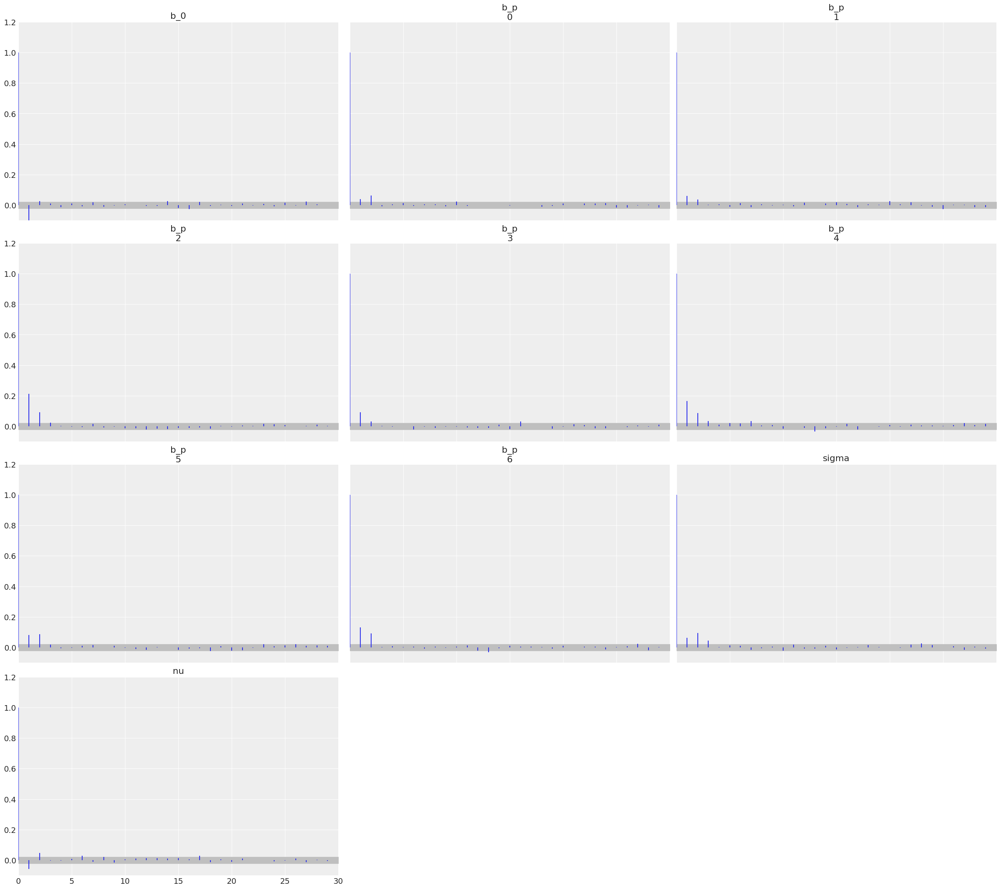

In [59]:
az.plot_autocorr(inf_robust, max_lag = 30, combined = True)
plt.ylim([-0.1, 1.2])

**Summary ACF for `Robust Model`**

- **b_0, b_p\[i\], and sigma:** The ACF plots for these parameters mimic the desirable patterns seen in the Gaussian model, indicating a well-performing MCMC sampling process.

- **nu(Degrees of Freedom):** The ACF plot for `nu` shows no problematic autocorrelation, suggesting that the degree of robustness against outliers is being reliably estimated.

### 3.2 Pairs plots for intercept and slopes of both models

In [84]:
vars_intercept_sloples = ['b_0', 'b_p']

- **Pairs plots for the Gaussian Model**

array([[<Axes: ylabel='b_p\n0'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >],
       [<Axes: ylabel='b_p\n1'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >],
       [<Axes: ylabel='b_p\n2'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >],
       [<Axes: ylabel='b_p\n3'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >],
       [<Axes: ylabel='b_p\n4'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >],
       [<Axes: ylabel='b_p\n5'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >],
       [<Axes: xlabel='b_0', ylabel='b_p\n6'>, <Axes: xlabel='b_p\n0'>,
        <Axes: xlabel='b_p\n1'>, <Axes: xlabel='b_p\n2'>,
        <Axes: xlabel='b_p\n3'>, <Axes: xlabel='b_p\n4'>,
        <Axes: xlabel='b_p\n5'>]], dtype=object)

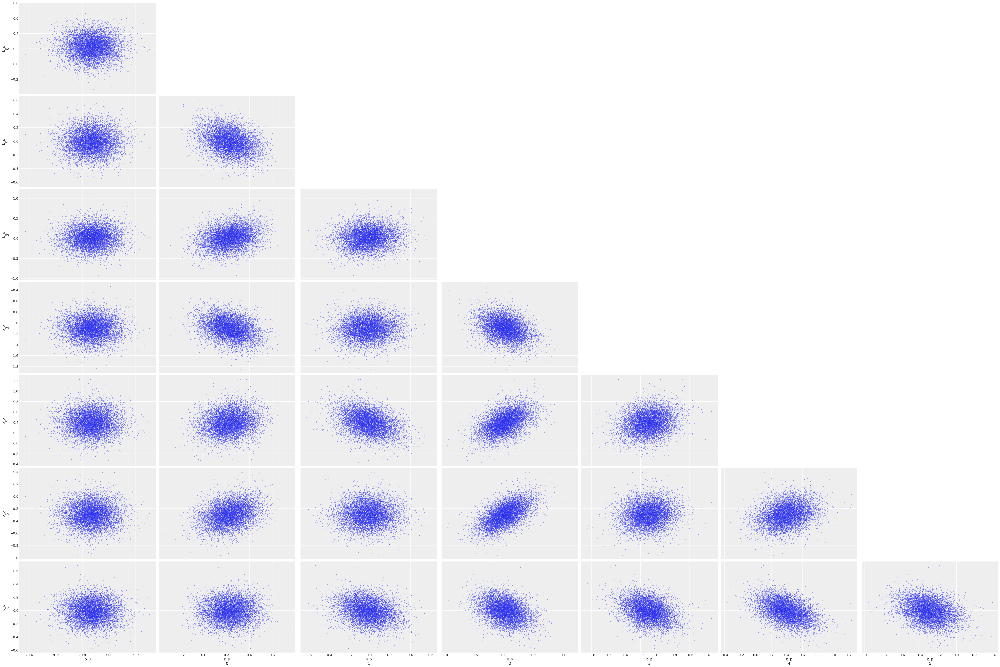

In [85]:
az.plot_pair(inf_gaussian, 
             var_names = vars_intercept_sloples,
             scatter_kwargs = {'alpha': 0.5})

**Summary Pairs Plots for `Gaussian Model`**

- **Inter-Parameter Relationships**: Each subplot shows the relationship between two parameters. For example, the plot in the first row, second column, illustrates the relationship between `b_0` (the intercept) and `b_p[0]` (the first slope coefficient). A pairs plot is useful for visualizing potential correlations between parameters.

- **Distribution Shape**: The cloud of points in each subplot suggests the joint distribution of the parameter pair. A circular cloud indicates little to no correlation, whereas an elongated cloud along a line indicates a stronger correlation.

- **Parameter Independence**: Ideally, the parameters of a well-specified model should be relatively independent unless there is a known correlation due to the model structure. In these plots, the clouds are somewhat elongated, suggesting possible correlations between some parameters.


- **Pairs plots for the Robust Model**

array([[<Axes: ylabel='b_p\n0'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >],
       [<Axes: ylabel='b_p\n1'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >],
       [<Axes: ylabel='b_p\n2'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >],
       [<Axes: ylabel='b_p\n3'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >],
       [<Axes: ylabel='b_p\n4'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >],
       [<Axes: ylabel='b_p\n5'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >],
       [<Axes: xlabel='b_0', ylabel='b_p\n6'>, <Axes: xlabel='b_p\n0'>,
        <Axes: xlabel='b_p\n1'>, <Axes: xlabel='b_p\n2'>,
        <Axes: xlabel='b_p\n3'>, <Axes: xlabel='b_p\n4'>,
        <Axes: xlabel='b_p\n5'>]], dtype=object)

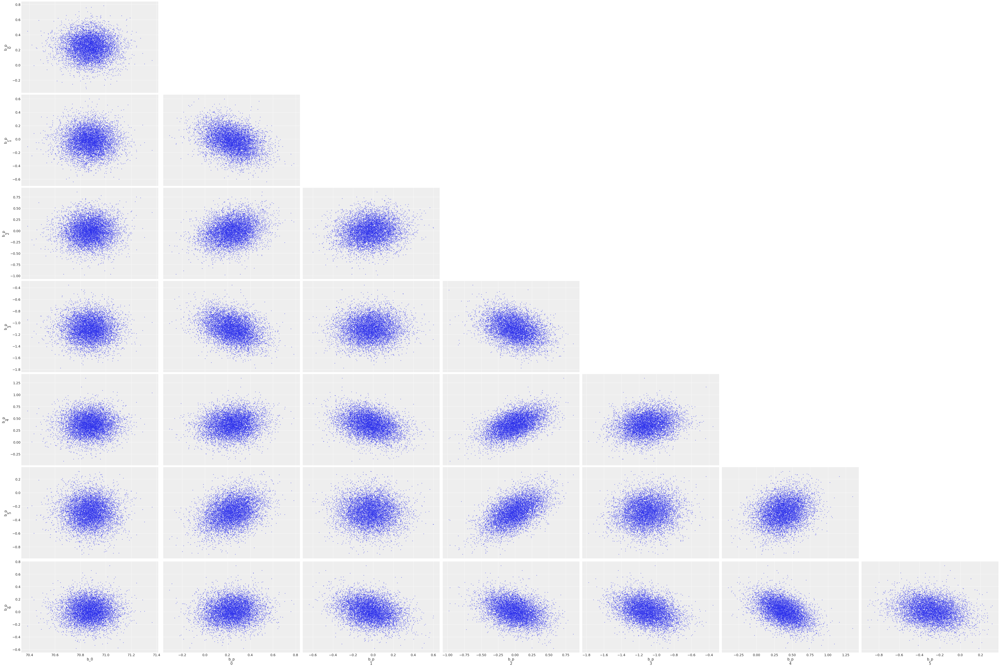

In [87]:
az.plot_pair(inf_robust,
             var_names = vars_intercept_sloples,
             scatter_kwargs = {'alpha': 0.5})

**Summary Pairs Plots for `Robust Model`**

- **Similar Interpretation**: As with the Gaussian model, these plots illustrate the relationships between the intercept and slope coefficients. 

- **Visual Differences**: There might be slight visual differences in the distribution shapes compared to the Gaussian model, which could be due to the robust model's heavier tails in the likelihood function.

- **Degree of Spread**: The spread of the points can indicate the uncertainty in estimating the parameters. Wider spreads can suggest more significant uncertainty.

### 3.3 HDIs for intercept and slopes for both models using 80% and 95% levels. Analyze significance of the parameters depending on the level

- **HDIs for the Gaussian Model**

In [88]:
hdi_80_gaussian = az.hdi(inf_gaussian, 
                         var_names = vars_intercept_sloples,
                         hdi_prob = 0.8)
hdi_80_gaussian

<xarray.Dataset>
Dimensions:    (hdi: 2, b_p_dim_0: 7)
Coordinates:
  * b_p_dim_0  (b_p_dim_0) int64 0 1 2 3 4 5 6
  * hdi        (hdi) <U6 'lower' 'higher'
Data variables:
    b_0        (hdi) float64 70.74 71.02
    b_p        (b_p_dim_0, hdi) float64 0.06274 0.3989 ... -0.1894 0.1874

array([<Axes: title={'center': '80.0% HDI'}>], dtype=object)

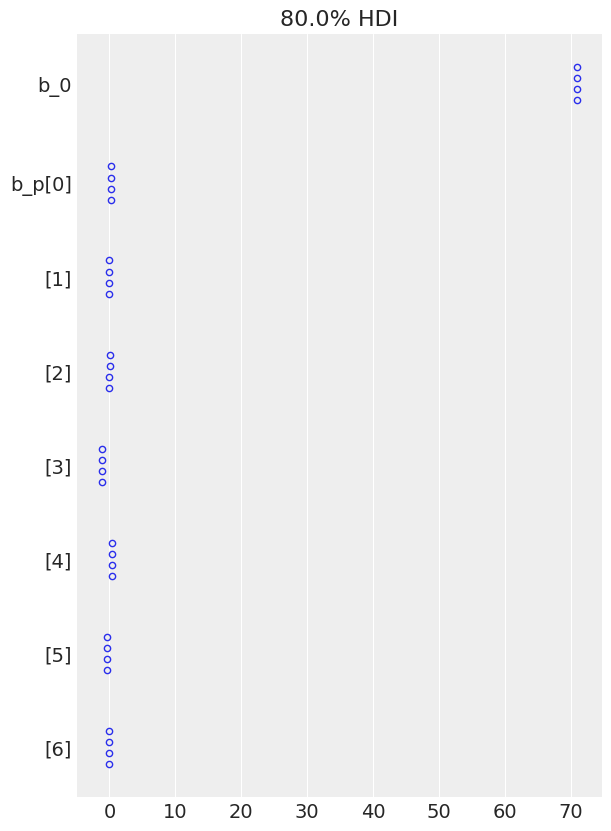

In [89]:
az.plot_forest(inf_gaussian, var_names = vars_intercept_sloples, hdi_prob = 0.8)

In [90]:
hdi_95_gaussian = az.hdi(inf_gaussian, 
                         var_names = vars_intercept_sloples,
                         hdi_prob = 0.95)
hdi_95_gaussian

<xarray.Dataset>
Dimensions:    (hdi: 2, b_p_dim_0: 7)
Coordinates:
  * b_p_dim_0  (b_p_dim_0) int64 0 1 2 3 4 5 6
  * hdi        (hdi) <U6 'lower' 'higher'
Data variables:
    b_0        (hdi) float64 70.66 71.1
    b_p        (b_p_dim_0, hdi) float64 -0.03133 0.4858 ... -0.2824 0.284

array([<Axes: title={'center': '95.0% HDI'}>], dtype=object)

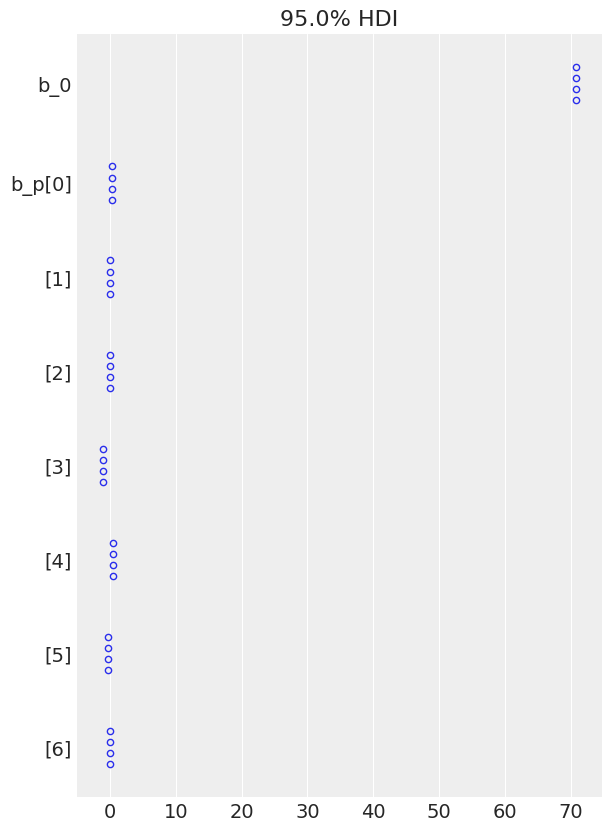

In [91]:
az.plot_forest(inf_gaussian, var_names = vars_intercept_sloples, hdi_prob = 0.95)

- **HDIs for the Robust Model**

In [92]:
hdi_80_robust = az.hdi(inf_robust, 
                       var_names = vars_intercept_sloples,
                       hdi_prob = 0.8)
hdi_80_robust

<xarray.Dataset>
Dimensions:    (hdi: 2, b_p_dim_0: 7)
Coordinates:
  * b_p_dim_0  (b_p_dim_0) int64 0 1 2 3 4 5 6
  * hdi        (hdi) <U6 'lower' 'higher'
Data variables:
    b_0        (hdi) float64 70.72 71.0
    b_p        (b_p_dim_0, hdi) float64 0.05418 0.3971 -0.239 ... -0.1765 0.2122

array([<Axes: title={'center': '80.0% HDI'}>], dtype=object)

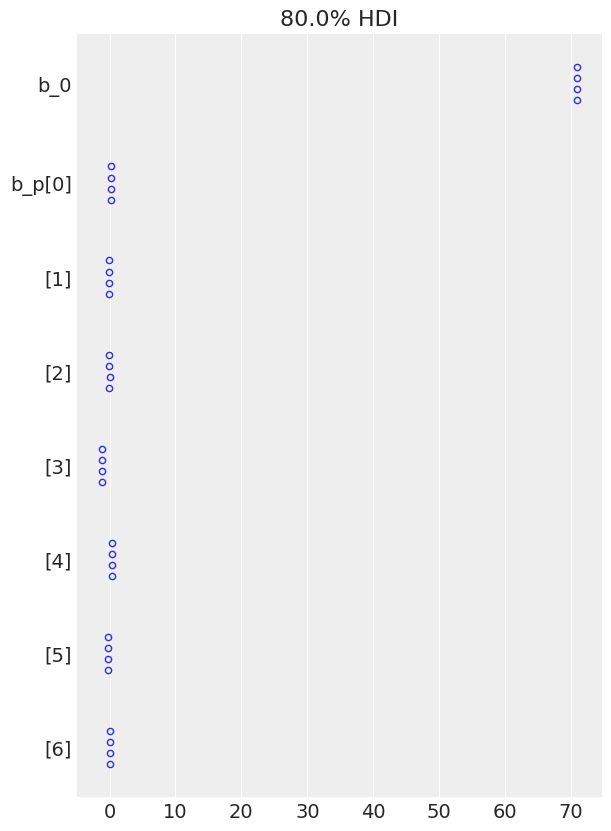

In [93]:
az.plot_forest(inf_robust, var_names = vars_intercept_sloples, hdi_prob = 0.8)

In [94]:
hdi_95_robust = az.hdi(inf_robust, 
                       var_names = vars_intercept_sloples,
                       hdi_prob = 0.95)
hdi_95_robust

<xarray.Dataset>
Dimensions:    (hdi: 2, b_p_dim_0: 7)
Coordinates:
  * b_p_dim_0  (b_p_dim_0) int64 0 1 2 3 4 5 6
  * hdi        (hdi) <U6 'lower' 'higher'
Data variables:
    b_0        (hdi) float64 70.65 71.09
    b_p        (b_p_dim_0, hdi) float64 -0.02385 0.5104 ... -0.2746 0.3228

array([<Axes: title={'center': '95.0% HDI'}>], dtype=object)

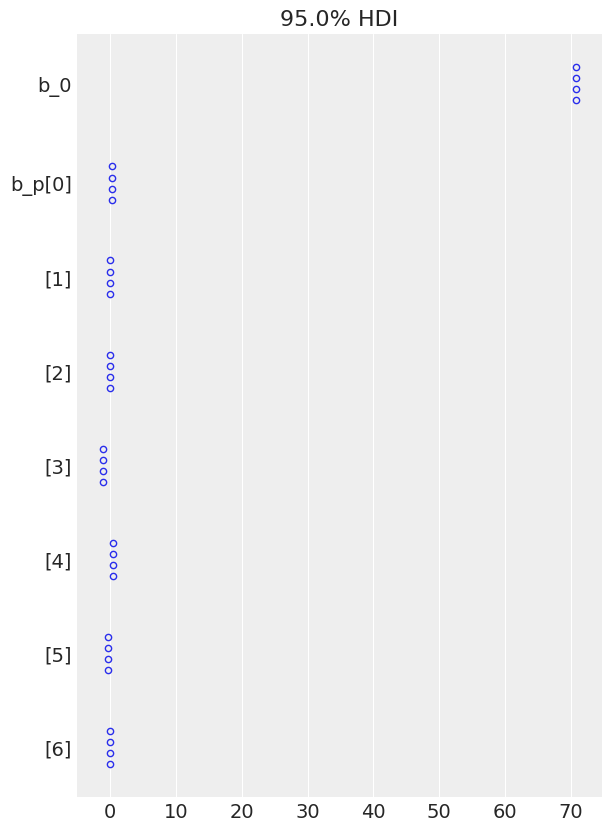

In [95]:
az.plot_forest(inf_robust, var_names = vars_intercept_sloples, hdi_prob = 0.95)

**Summary HDIs for the Gaussian and Robust Models:**

- **Intercept (b_0)**: The HDI for the intercept is narrow for both models and at both levels, showing that the estimate for the intercept is precise and consistent across the posterior distribution.

- **Slope Coefficients (b_p\[i\])**: The slopes have wider intervals, particularly at the 95% HDI level, indicating more uncertainty in these estimates than the intercept. However, the fact that the intervals are finite and do not include zero at the 80% HDI could suggest that these parameters have a significant effect, assuming zero is outside the HDI.

- **Significance of Parameters**: The significance of parameters can be partially inferred from these plots. If the HDI for a parameter does not include zero, it suggests a significant effect at the chosen probability level. However, traditional notions of "statistical significance" do not directly apply in Bayesian statistics as in frequentist statistics; instead, the entire distribution of the parameter values should be considered.

### 3.4 Compare correlation matrices for the slope parameters of both models with the correlation matrix of the original features. Pay attention to the signs of correlations

- **Correlation Matrix for Original Features**

Text(0.5, 1.0, 'Correlation Matrix of Original Features')

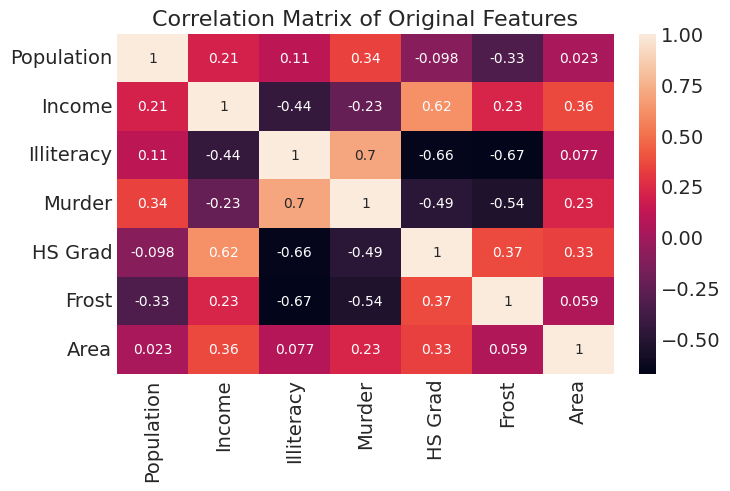

In [96]:
# Compute Correlations Matrix 
corr_matrix_original = X_standardized.corr()

# Create heatmap
sns.heatmap(corr_matrix_original, annot = True)
plt.title("Correlation Matrix of Original Features")

**Summary Correlation Matrix for `Original` Features:**

- Strong correlations are indicated by values close to 1 or -1. For instance, there is a strong positive correlation between `Murder` and `Illiteracy`, and a strong negative correlation between `Illiteracy` and `HS Grad`.

- Weak correlations are indicated by values close to 0. For example, `Area` seems to have weak correlations with most other features.

- **Correlation Matrix for the Gaussian Model**

Text(0.5, 1.0, 'Correlation Matrix of Gaussian Model Slopes')

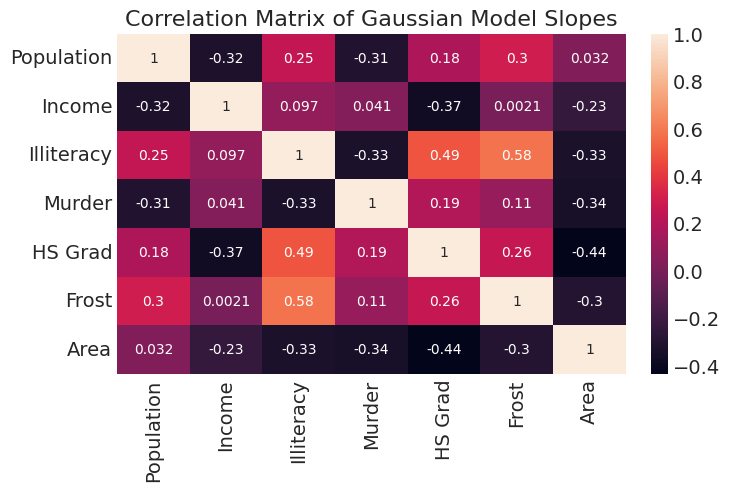

In [97]:
# Extrat Slope Params
slopes_gaussian = inf_gaussian.posterior['b_p'].values.reshape(-1, num_predictors)

# Compute Correlation Matrix
corr_matrix_gaussian = np.corrcoef(slopes_gaussian, rowvar = False)

# Create heatmap
sns.heatmap(corr_matrix_gaussian, annot = True, xticklabels = names_predictors, yticklabels = names_predictors)
plt.title("Correlation Matrix of Gaussian Model Slopes")

**Summary Correlation Matrix for `Gaussian` Features:**

- Compared to the original features, some correlations have changed, possibly due to the model adjusting for the influence of other variables.

- For instance, the correlation between the slope of `Population` and `Income` is negative in the model, whereas it was positive in the original features. This could suggest that after accounting for other variables, these two features have an inverse relationship with the response variable in the Gaussian model.

- **Correlation Matrix for the Robust Model**

Text(0.5, 1.0, 'Correlation Matrix of Robust Model Slopes')

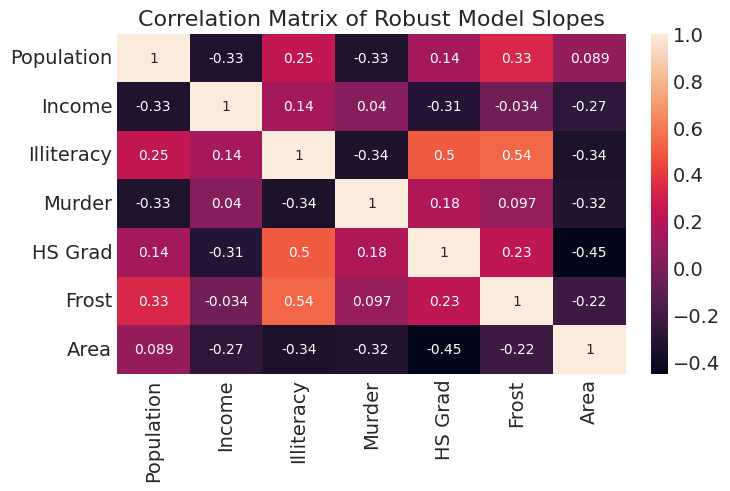

In [98]:
# Extract Slope Params
slopes_robust = inf_robust.posterior['b_p'].values.reshape(-1, num_predictors)

# Compute Correlation Matrix
corr_matrix_robust = np.corrcoef(slopes_robust, rowvar = False)

# Create heatmap
sns.heatmap(corr_matrix_robust, annot = True, xticklabels = names_predictors, yticklabels = names_predictors)
plt.title("Correlation Matrix of Robust Model Slopes")

**Summary Correlation Matrix for `Robust` Features:**

- This matrix is similar to the Gaussian one but shows the correlations for the Robust model's slopes.

- The Robust model might show different correlations than the Gaussian model due to its different treatment of outliers and the distribution of residuals.

- Comparing this matrix to the Gaussian model's, we observe that some correlations remain similar. In contrast, others differ, which could be due to the robust model's handling of outliers affecting the relationship between certain variables.

### 3.5 Comparison of the mean values of the chains for intercepts and slopes for both models, and comparison of coefficients of both Bayesian models with the linear model fitted to the same data

- **Mean Values of Chains for Intercepts and Slopes for the Gaussian Model**

In [99]:
mean_intercept_gaussian = inf_gaussian.posterior['b_0'].mean().values
mean_intercept_gaussian

array(70.8694978)

In [100]:
mean_slopes_gaussian = inf_gaussian.posterior['b_p'].mean().values
mean_slopes_gaussian

array(-0.11208249)

**Summary Mean Values of Chains for `Gaussian Model`:**

The intercept has a mean of approximately 70.87, and the array of mean slopes shows a mix of positive and negative values, indicating varying directions of effect for different predictors.

- **Mean Values of Chains for Intercepts and Slopes for the Robust Model**

In [101]:
mean_intercept_robust = inf_robust.posterior['b_0'].mean().values
mean_intercept_robust

array(70.87200655)

In [102]:
mean_slopes_robust = inf_robust.posterior['b_p'].mean().values
mean_slopes_robust

array(-0.11616736)

**Summary Mean Values of Chains for `Robust Model`:**

The intercept also has a mean of approximately 70.87, which is very close to the Gaussian model's intercept. The mean slopes array shows values that are also a mix of positive and negative, indicating similar variance in effect directions as the Gaussian model.

- **Fit a Linear Model**

In [103]:
X_with_intercept = sm.add_constant(X_standardized)
linear_model = sm.OLS(y, X_with_intercept).fit()

# Coef of the linear model
linear_model_coef = linear_model.params.values

In [104]:
linear_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               Life Exp   R-squared:                       0.736
Model:                            OLS   Adj. R-squared:                  0.692
Method:                 Least Squares   F-statistic:                     16.74
Date:                Wed, 22 Nov 2023   Prob (F-statistic):           2.53e-10
Time:                        11:38:31   Log-Likelihood:                -51.855
No. Observations:                  50   AIC:                             119.7
Df Residuals:                      42   BIC:                             135.0
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         70.8786      0.105    672.936      0.000      70.666      71.091
Population     0.2313      0.130      1.775      0.083      -0.032       0.494
Income        -0.0134      0.150     -0.089      0.929      -0.316       0.290
Illiteracy     0.0206      0.223      0.092      0.927      -0.430       0.471
Murder        -1.1116      0.172     -6.459      0.000      -1.459      -0.764
HS Grad        0.3952      0.188      2.098      0.042       0.015       0.775
Frost         -0.2981      0.163     -1.825      0.075      -0.628       0.032
Area          -0.0063      0.142     -0.044      0.965      -0.294       0.281
==============================================================================
Omnibus:                        2.385   Durbin-Watson:                   1.929
Prob(Omnibus):                  0.303   Jarque-Bera (JB):                1.420
Skew:                          -0.081   Prob(JB):                        0.492
Kurtosis:                       2.190   Cond. No.                         4.73
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

**Summary for `Linear Model`**

- The intercept estimate is approximately 70.87, consistent with the Bayesian models.

- The slope coefficients for predictors like `Population,` `Income,` and `HS Grad` are positive, while for `Illiteracy,` `Murder,` and `Frost` are negative. This suggests various relationships between each predictor and the `Life Exp` response variable.

- The p-values indicate whether each coefficient is statistically significant at conventional levels (typically p < 0.05). For instance, the `Murder` and `Frost` variables have p-values less than 0.05, suggesting their coefficients significantly differ from zero.

**Comparison and Analysis**

- The Bayesian and OLS models provide similar estimates for the intercept, indicating consistency across methods.

- The Bayesian and OLS models have some differences in the slope estimates. These differences could be due to the Bayesian models incorporating prior information and the robust model accounting for outliers, while the OLS model does not.

- In the Bayesian context, significance is assessed by checking if the credible intervals (e.g., HDI) exclude zero. In the frequentist context (OLS), significance is determined by p-values.

- The OLS model's R-squared value is around 0.736, which suggests that the model explains approximately 73.6% of the variability in `Life Exp.`